# Setup

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import scanpy as sc
import pandas as pd

In [3]:
import seaborn as sns

import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

sc.settings.set_figure_params(dpi=100) # save umaps as non-vectorial hi-res images
# plt.rcParams['figure.figsize']=(10,10) # make figures square if not using the setting bellow


In [4]:
import sys
sys.path.append('/home/angela/src/scVI_TSP/')
sys.path.append('/home/angela/sapiens/tabula-sapiens/')
# from utils.annotations_utils import *
from utils.colorDict import *
from utils.general_utils import *
from utils.plotting_utils import *

# Load the color dictionaries

In [5]:
donors_color_dict = donor_colors()
tissues_color_dict = tissue_colors()
methods_color_dict = method_colors()
compartments_color_dict = compartment_colors()

{'TSP1': '#40b5c4', 'TSP2': '#081d58'}

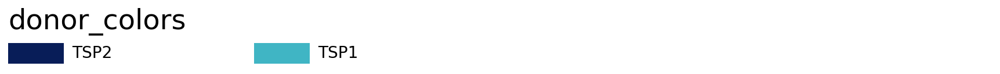

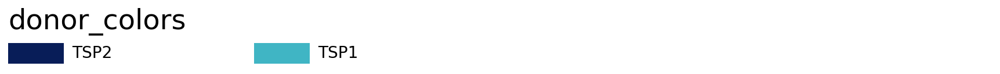

In [6]:
display(donors_color_dict)
plot_colortable(donors_color_dict,'donor_colors')

{'Bladder': '#e7969c',
 'Blood': '#d6616b',
 'Bone_Marrow': '#cedb9c',
 'Kidney': '#7b4173',
 'Large_Intestine': '#31a354',
 'Lung': '#3182bd',
 'Lymph_Node': '#8c6d31',
 'Muscle': '#e7ba52',
 'Pancreas': '#fd8d3c',
 'Small_Intestine': '#6baed6',
 'Spleen': '#393b79',
 'Thymus': '#9c9ede',
 'Trachea': '#969696',
 'Vasculature': '#843c39'}

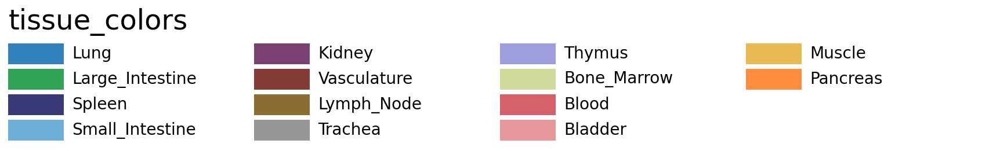

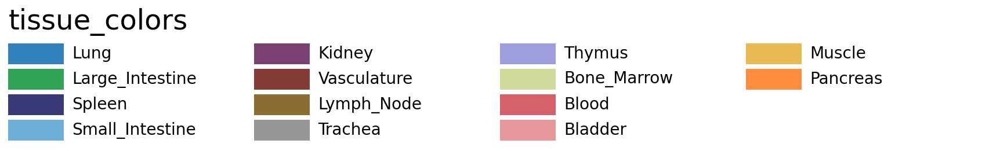

In [7]:
display(tissues_color_dict)
plot_colortable(tissues_color_dict,'tissue_colors')

{'10X': '#90ee90', 'smartseq2': '#006400'}

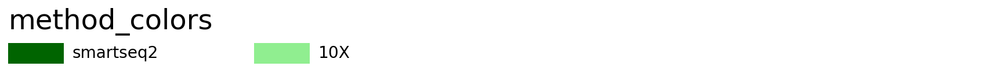

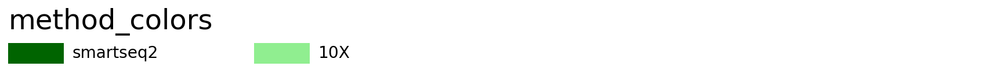

In [8]:
display(methods_color_dict)
plot_colortable(methods_color_dict,'method_colors')

{'Endothelial': '#fee187',
 'Epithelial': '#feab49',
 'Immune': '#fc5b2e',
 'Stromal': '#d41020',
 'PNS': '#800026'}

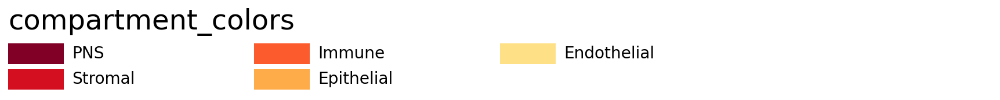

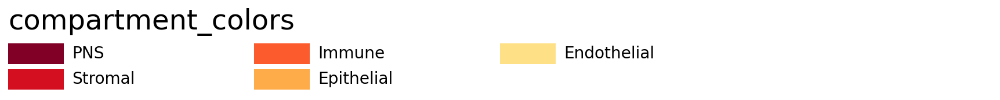

In [9]:
display(compartments_color_dict)
plot_colortable(compartments_color_dict,'compartment_colors')

# Load the data

In [10]:
data_path = "/mnt/ibm_lg/angela/sapiens/data/sapiens_paper1/"

In [11]:
adata = sc.read_h5ad(data_path + "Pilot1_Pilot2_decontX_Oct2020.h5ad")
adata = remove_cats(adata)
adata

AnnData object with n_obs × n_vars = 149345 × 58870
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_metho

In [35]:
adata = sc.read_h5ad("/mnt/ibm_lg/angela/sapiens/data/Pilot1_Pilot2.decontX.MT-not-filtered.h5ad")
adata = remove_cats(adata)
adata

AnnData object with n_obs × n_vars = 194302 × 58870
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_metho

Make sure the colors are set correctly

In [14]:
# adata.uns['donor_colors'] = list(donors_color_dict.values())
# adata.uns['method_colors'] = list(methods_color_dict.values())
# adata.uns['compartmen_colors'] = list(compartments_color_dict.values())
# adata.uns['tissue_colors'] = list(tissues_color_dict.values())

# Velocyto

In [14]:
import scvelo as scv

## Pilot 1

### make the velocyto objs

In [ ]:
# run kb tools

# kb count --h5ad 
# -i ./COMET/kb_rna_velocity_index/index.idx 
# -g ./COMET/kb_rna_velocity_index/t2g.txt 
# -x 10XV2 
# -o ./COMET/rna_velocity_ouputs/COMET_1024_Total_Day0/ 
# -c1 ./COMET/kb_rna_velocity_index/spliced_t2c.txt 
# -c2 ./COMET/kb_rna_velocity_index/unspliced_t2c.txt 
# --lamanno /mnt/ibm_lg/angela/COMET/COMET_1024_Total_Day0/1024_Tot_S3_L001_R1_001.fastq.gz 
# /mnt/ibm_lg/angela/COMET/COMET_1024_Total_Day0/1024_Tot_S3_L001_R2_001.fastq.gz 
# /mnt/ibm_lg/angela/COMET/COMET_1024_Total_Day0/1024_Tot_S3_L002_R1_001.fastq.gz 
# /mnt/ibm_lg/angela/COMET/COMET_1024_Total_Day0/1024_Tot_S3_L002_R2_001.fastq.gz




In [ ]:
import os
vdirs = os.listdir("/mnt/ibm_sm/home/lily_li/tabula_sapiens/rna_velocity_outputs/")
vdirs

In [ ]:
adata_velocyto = []
for v in vdirs:
    print(v)
    aux_velocyto = sc.read_h5ad(
    "/mnt/ibm_sm/home/lily_li/tabula_sapiens/rna_velocity_outputs/"+v+"/counts_unfiltered/adata.h5ad")
    aux_velocyto.obs['cell_id'] = aux_velocyto.obs.index + "_" + v
    
    try:
        adata_velocyto = adata_velocyto.concatenate(aux_velocyto)
    except:
        adata_velocyto = aux_velocyto
        
adata_velocyto

In [ ]:
adata_velocyto.write("/mnt/ibm_lg/angela/sapiens/velocyto/TSP1_merged_velocyto_adata.h5ad")

### Concatenate with counts

In [36]:
adata_velocyto = sc.read_h5ad("/mnt/ibm_lg/angela/sapiens/velocyto/TSP1_merged_velocyto_adata.h5ad")

In [37]:
adata_velocyto.var.head()

""
ENSG00000277400.1
ENSG00000274847.1
ENSG00000276256.1
ENSG00000278198.1
ENSG00000273496.1


In [38]:
adata.var_names = adata.var["ensembl_id"]

In [39]:
adata.var.head()

,feature_types.0.0,n_cells.0.0,gene_symbol.0.0,n_cells.1.0,n_cells.0,n_cells.1.1,feature_types.0.0.0.1,gene_symbol.0.0.0.1,n_cells.1.0.0.1,n_cells.1.0.1,...,contamination_prop-13,contamination_prop-14,contamination_prop-2,contamination_prop-3,contamination_prop-4,contamination_prop-5,contamination_prop-6,contamination_prop-7,contamination_prop-8,contamination_prop-9
ensembl_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000223972.5,Gene Expression,0,DDX11L1,2,2,16,Gene Expression,DDX11L1,21,25,...,0.000000,0.000000e+00,2.162612e-06,0.000000,0.000000e+00,1.267378e-05,0.000000e+00,4.594497e-05,0.000000e+00,1.867665e-18
ENSG00000227232.5,Gene Expression,1,WASH7P,529,529,581,Gene Expression,WASH7P,598,795,...,0.000169,1.419328e-04,8.286748e-04,0.000006,2.232487e-03,3.504161e-04,5.075622e-04,4.067382e-04,1.243561e-03,1.782947e-03
ENSG00000278267.1,Gene Expression,0,MIR6859-1,7,7,9,Gene Expression,MIR6859-1,6,8,...,0.000000,1.724389e-07,4.056721e-19,0.000000,3.556697e-20,8.224157e-08,5.761062e-07,1.175873e-05,1.970205e-07,5.308250e-10
ENSG00000243485.5,Gene Expression,0,MIR1302-2HG,4,4,2,Gene Expression,MIR1302-2HG,7,7,...,0.000000,0.000000e+00,0.000000e+00,0.000000,1.206931e-04,6.224352e-20,3.477472e-17,4.132085e-07,1.808086e-05,3.136054e-18
ENSG00000284332.1,Gene Expression,0,MIR1302-2,0,0,0,Gene Expression,MIR1302-2,0,0,...,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00


In [40]:
adata_tsp1_velocyto_counts = adata[adata.obs["cell_id"].isin(adata_velocyto.obs['cell_id'])].copy()
adata_tsp1_velocyto_vel = adata_velocyto[adata_velocyto.obs["cell_id"].isin(adata_tsp1_velocyto_counts.obs['cell_id'])].copy()

adata_tsp1_velocyto_vel,adata_tsp1_velocyto_counts,adata[adata.obs['donor']=='TSP1']


(AnnData object with n_obs × n_vars = 41307 × 58367
     obs: 'batch', 'cell_id'
     layers: 'spliced', 'unspliced',
 AnnData object with n_obs × n_vars = 41307 × 58870
     obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed',

In [41]:
adata_tsp1_velocyto_counts.obs = adata_tsp1_velocyto_counts.obs.set_index('cell_id')
adata_tsp1_velocyto_vel.obs = adata_tsp1_velocyto_vel.obs.set_index('cell_id')


adata_merged_tsp1_velocyto = scv.utils.merge(adata_tsp1_velocyto_counts, adata_tsp1_velocyto_vel)

In [42]:
# adata_merged_tsp1_velocyto = scv.utils.merge(adata_tsp1_velocyto_counts, adata_tsp1_velocyto_vel)


In [43]:
adata_merged_tsp1_velocyto.var=adata_merged_tsp1_velocyto.var.rename({"ensembl_id":"ensemble"},axis=1)

In [44]:
adata_merged_tsp1_velocyto.write_h5ad(data_path+"TSP1_merged_counts_velocyto_adata_MT-not-filtered.h5ad")

... storing 'X10X_run' as categorical
... storing 'smartseq2_barcode' as categorical
... storing 'smartseq2_library_plate' as categorical
... storing 'smartseq2_sorting_direction' as categorical
... storing 'smartseq2_sort_order' as categorical
... storing 'smartseq2_cDNA_Plate' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'X10X_replicate' as categorical
... storing 'sequencer' as categorical
... storing 'sex' as categorical
... storing 'tissue' as categorical
... storing 'smartseq2_well_seq' as categorical
... storing 'notes' as categorical
... storing 'smartseq2_sorted_population' as categorical
... storing 'X10X_sample' as categorical
... storing 'anatomical_position' as categorical
... storing 'manual_cell_ontology_class' as categorical
... storing 'manual_annotation' as categorical
... storing 'compartment' as categorical
... storing 'batch' as categorical
... storing 'compartment_pred' as categorical
... storing 'leiden' as cat

In [45]:
adata_merged_tsp1_velocyto.var

,feature_types.0.0,n_cells.0.0,gene_symbol.0.0,n_cells.1.0,n_cells.0,n_cells.1.1,feature_types.0.0.0.1,gene_symbol.0.0.0.1,n_cells.1.0.0.1,n_cells.1.0.1,...,contamination_prop-13,contamination_prop-14,contamination_prop-2,contamination_prop-3,contamination_prop-4,contamination_prop-5,contamination_prop-6,contamination_prop-7,contamination_prop-8,contamination_prop-9
ensembl_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000223972.5,Gene Expression,0,DDX11L1,2,2,16,Gene Expression,DDX11L1,21,25,...,0.000000,0.000000,0.000002,0.000000,0.000000,1.267378e-05,0.000000e+00,4.594497e-05,0.000000,1.867665e-18
ENSG00000227232.5,Gene Expression,1,WASH7P,529,529,581,Gene Expression,WASH7P,598,795,...,0.000169,0.000142,0.000829,0.000006,0.002232,3.504161e-04,5.075622e-04,4.067382e-04,0.001244,1.782947e-03
ENSG00000243485.5,Gene Expression,0,MIR1302-2HG,4,4,2,Gene Expression,MIR1302-2HG,7,7,...,0.000000,0.000000,0.000000,0.000000,0.000121,6.224352e-20,3.477472e-17,4.132085e-07,0.000018,3.136054e-18
ENSG00000284332.1,Gene Expression,0,MIR1302-2,0,0,0,Gene Expression,MIR1302-2,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
ENSG00000237613.2,Gene Expression,0,FAM138A,0,0,0,Gene Expression,FAM138A,5,5,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000212907.2,Gene Expression,39753,MT-ND4L,3773,43502,2886,Gene Expression,MT-ND4L,3323,3829,...,0.245388,0.042067,0.027515,0.513881,0.237282,6.105231e-02,4.292443e-02,6.452347e-02,0.231281,1.179137e-01
ENSG00000198886.2,Gene Expression,43308,MT-ND4,4164,47434,3375,Gene Expression,MT-ND4,3662,4163,...,0.322124,0.061731,0.039478,0.521692,0.234714,9.032769e-02,5.565150e-02,6.833320e-02,0.247091,1.427487e-01
ENSG00000198786.2,Gene Expression,42755,MT-ND5,3979,46700,3326,Gene Expression,MT-ND5,3605,4103,...,0.304231,0.059266,0.031469,0.526367,0.243975,9.510543e-02,5.372530e-02,6.688519e-02,0.278760,1.190183e-01


## Pilot 2

### make the velocyto objs

In [ ]:
import os
vdirs2 = os.listdir("/mnt/ibm_sm/home/lily_li/tabula_sapiens/rna_velocity_outputs/pilot2/")
vdirs2

In [ ]:
adata_velocyto_tsp2 = []
for v in vdirs2:
    print(v)
    aux_velocyto_tsp2 = sc.read_h5ad(
    "/mnt/ibm_sm/home/lily_li/tabula_sapiens/rna_velocity_outputs/pilot2/"+v+"/counts_unfiltered/adata.h5ad")
    aux_velocyto_tsp2.obs['cell_id'] = aux_velocyto_tsp2.obs.index + "_" + v
    
    try:
        adata_velocyto_tsp2 = adata_velocyto_tsp2.concatenate(aux_velocyto_tsp2)
    except:
        adata_velocyto_tsp2 = aux_velocyto_tsp2
        
adata_velocyto_tsp2

In [ ]:
adata_velocyto_tsp2.write("/mnt/ibm_lg/angela/sapiens/velocyto/TSP2_merged_velocyto_adata.h5ad")

### Concatenate with counts

In [47]:
adata_velocyto_tsp2 = sc.read_h5ad("/mnt/ibm_lg/angela/sapiens/velocyto/TSP2_merged_velocyto_adata.h5ad")

In [48]:
adata.var_names

Index(['ENSG00000223972.5', 'ENSG00000227232.5', 'ENSG00000278267.1',
       'ENSG00000243485.5', 'ENSG00000284332.1', 'ENSG00000237613.2',
       'ENSG00000268020.3', 'ENSG00000240361.2', 'ENSG00000186092.6',
       'ENSG00000238009.6',
       ...
       'ENSG00000198886.2', 'ENSG00000210176.1', 'ENSG00000210184.1',
       'ENSG00000210191.1', 'ENSG00000198786.2', 'ENSG00000198695.2',
       'ENSG00000210194.1', 'ENSG00000198727.2', 'ENSG00000210195.2',
       'ENSG00000210196.2'],
      dtype='object', name='ensembl_id', length=58870)

In [49]:
adata_tsp2_velocyto_counts = adata[adata.obs["cell_id"].isin(adata_velocyto_tsp2.obs['cell_id'])].copy()
display(adata_tsp2_velocyto_counts)

adata_tsp2_velocyto_vel = adata_velocyto_tsp2[adata_velocyto_tsp2.obs["cell_id"].isin(adata_tsp2_velocyto_counts.obs['cell_id'])]
display(adata_tsp2_velocyto_vel)


AnnData object with n_obs × n_vars = 135843 × 58870
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_metho

View of AnnData object with n_obs × n_vars = 135843 × 58367
    obs: 'batch', 'cell_id'
    layers: 'spliced', 'unspliced'

In [33]:
# adata_merged_tsp2_velocyto = scv.utils.merge(adata_tsp2_velocyto_counts, adata_tsp2_velocyto_vel)


In [50]:
adata_tsp2_velocyto_counts.obs = adata_tsp2_velocyto_counts.obs.set_index('cell_id')
adata_tsp2_velocyto_vel.obs = adata_tsp2_velocyto_vel.obs.set_index('cell_id')


adata_merged_tsp2_velocyto = scv.utils.merge(adata_tsp2_velocyto_counts, adata_tsp2_velocyto_vel)

In [51]:
adata_merged_tsp2_velocyto

AnnData object with n_obs × n_vars = 135843 × 52549
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_method', 'decont

In [52]:
adata_merged_tsp2_velocyto.var=adata_merged_tsp2_velocyto.var.rename({"ensembl_id":"ensembl"},axis=1)

In [53]:
adata_merged_tsp2_velocyto.var

,feature_types.0.0,n_cells.0.0,gene_symbol.0.0,n_cells.1.0,n_cells.0,n_cells.1.1,feature_types.0.0.0.1,gene_symbol.0.0.0.1,n_cells.1.0.0.1,n_cells.1.0.1,...,contamination_prop-13,contamination_prop-14,contamination_prop-2,contamination_prop-3,contamination_prop-4,contamination_prop-5,contamination_prop-6,contamination_prop-7,contamination_prop-8,contamination_prop-9
ensembl_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000223972.5,Gene Expression,0,DDX11L1,2,2,16,Gene Expression,DDX11L1,21,25,...,0.000000,0.000000,0.000002,0.000000,0.000000,1.267378e-05,0.000000e+00,4.594497e-05,0.000000,1.867665e-18
ENSG00000227232.5,Gene Expression,1,WASH7P,529,529,581,Gene Expression,WASH7P,598,795,...,0.000169,0.000142,0.000829,0.000006,0.002232,3.504161e-04,5.075622e-04,4.067382e-04,0.001244,1.782947e-03
ENSG00000243485.5,Gene Expression,0,MIR1302-2HG,4,4,2,Gene Expression,MIR1302-2HG,7,7,...,0.000000,0.000000,0.000000,0.000000,0.000121,6.224352e-20,3.477472e-17,4.132085e-07,0.000018,3.136054e-18
ENSG00000284332.1,Gene Expression,0,MIR1302-2,0,0,0,Gene Expression,MIR1302-2,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
ENSG00000237613.2,Gene Expression,0,FAM138A,0,0,0,Gene Expression,FAM138A,5,5,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000212907.2,Gene Expression,39753,MT-ND4L,3773,43502,2886,Gene Expression,MT-ND4L,3323,3829,...,0.245388,0.042067,0.027515,0.513881,0.237282,6.105231e-02,4.292443e-02,6.452347e-02,0.231281,1.179137e-01
ENSG00000198886.2,Gene Expression,43308,MT-ND4,4164,47434,3375,Gene Expression,MT-ND4,3662,4163,...,0.322124,0.061731,0.039478,0.521692,0.234714,9.032769e-02,5.565150e-02,6.833320e-02,0.247091,1.427487e-01
ENSG00000198786.2,Gene Expression,42755,MT-ND5,3979,46700,3326,Gene Expression,MT-ND5,3605,4103,...,0.304231,0.059266,0.031469,0.526367,0.243975,9.510543e-02,5.372530e-02,6.688519e-02,0.278760,1.190183e-01


In [54]:
adata_merged_tsp2_velocyto.write_h5ad(data_path + "TSP2_merged_counts_velocyto_adata_MT-not-filtered.h5ad")
adata_merged_tsp2_velocyto

... storing 'X10X_run' as categorical
... storing 'smartseq2_barcode' as categorical
... storing 'smartseq2_library_plate' as categorical
... storing 'smartseq2_sorting_direction' as categorical
... storing 'smartseq2_sort_order' as categorical
... storing 'smartseq2_cDNA_Plate' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'X10X_replicate' as categorical
... storing 'sequencer' as categorical
... storing 'sex' as categorical
... storing 'tissue' as categorical
... storing 'smartseq2_well_seq' as categorical
... storing 'notes' as categorical
... storing 'smartseq2_sorted_population' as categorical
... storing 'X10X_sample' as categorical
... storing 'anatomical_position' as categorical
... storing 'X10X_barcode' as categorical
... storing 'manual_cell_ontology_class' as categorical
... storing 'manual_annotation' as categorical
... storing 'compartment' as categorical
... storing 'batch' as categorical
... storing 'compartment_pred' 

AnnData object with n_obs × n_vars = 135843 × 52549
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_method', 'decont

## merge TSP1 and TSP2

In [55]:
# adata_merged_tsp1_velocyto = sc.read_h5ad(
#     data_path + "TSP1_merged_counts_velocyto_adata.h5ad")

adata_merged_tsp1_velocyto = sc.read_h5ad(
    data_path + "TSP1_merged_counts_velocyto_adata_MT-not-filtered.h5ad")

In [56]:
# adata_merged_tsp2_velocyto = sc.read_h5ad(
#     data_path + "TSP2_merged_counts_velocyto_adata.h5ad")

adata_merged_tsp2_velocyto = sc.read_h5ad(
    data_path + "TSP2_merged_counts_velocyto_adata_MT-not-filtered.h5ad")

In [57]:
adata_velocyto = adata_merged_tsp1_velocyto.concatenate(adata_merged_tsp2_velocyto)
# adata_velocyto.write(data_path + "TSP1_TSP2_merged_counts_velocyto.h5ad")
adata_velocyto.write(data_path + "TSP1_TSP2_merged_counts_velocyto_MT-not-filtered.h5ad")

... storing 'X10X_run' as categorical
... storing 'smartseq2_sort_order' as categorical
... storing 'donor' as categorical
... storing 'X10X_replicate' as categorical
... storing 'sequencer' as categorical
... storing 'tissue' as categorical
... storing 'notes' as categorical
... storing 'X10X_sample' as categorical
... storing 'anatomical_position' as categorical
... storing 'X10X_barcode' as categorical
... storing 'manual_cell_ontology_class' as categorical
... storing 'manual_annotation' as categorical
... storing 'leiden' as categorical
... storing 'cluster_id' as categorical
... storing 'Propagated.Annotation' as categorical
... storing 'Onclass' as categorical
... storing 'singlecellNet' as categorical
... storing 'kNN' as categorical
... storing 'SVM' as categorical
... storing 'scANVI' as categorical
... storing 'manual_cell_ontology_classcollapsed' as categorical
... storing 'Propagated.Annotationcollapsed' as categorical
... storing 'Onclasscollapsed' as categorical
... stor

In [58]:
adata_velocyto.var

,feature_types.0.0,n_cells.0.0,gene_symbol.0.0,n_cells.1.0,n_cells.0,n_cells.1.1,feature_types.0.0.0.1,gene_symbol.0.0.0.1,n_cells.1.0.0.1,n_cells.1.0.1,...,contamination_prop-4,contamination_prop-5,contamination_prop-6,contamination_prop-7,contamination_prop-8,contamination_prop-9,contamination_prop-0,ensemble-0,contamination_prop-1,ensembl-1
ensembl_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000223972.5,Gene Expression,0,DDX11L1,2,2,16,Gene Expression,DDX11L1,21,25,...,0.000000,1.267378e-05,0.000000e+00,4.594497e-05,0.000000,1.867665e-18,3.778246e-18,ENSG00000223972.5,6.225186e-05,ENSG00000223972.5
ENSG00000227232.5,Gene Expression,1,WASH7P,529,529,581,Gene Expression,WASH7P,598,795,...,0.002232,3.504161e-04,5.075622e-04,4.067382e-04,0.001244,1.782947e-03,6.022469e-04,ENSG00000227232.5,1.322876e-03,ENSG00000227232.5
ENSG00000243485.5,Gene Expression,0,MIR1302-2HG,4,4,2,Gene Expression,MIR1302-2HG,7,7,...,0.000121,6.224352e-20,3.477472e-17,4.132085e-07,0.000018,3.136054e-18,0.000000e+00,ENSG00000243485.5,4.989163e-07,ENSG00000243485.5
ENSG00000284332.1,Gene Expression,0,MIR1302-2,0,0,0,Gene Expression,MIR1302-2,0,0,...,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,ENSG00000284332.1,0.000000e+00,ENSG00000284332.1
ENSG00000237613.2,Gene Expression,0,FAM138A,0,0,0,Gene Expression,FAM138A,5,5,...,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,ENSG00000237613.2,0.000000e+00,ENSG00000237613.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000212907.2,Gene Expression,39753,MT-ND4L,3773,43502,2886,Gene Expression,MT-ND4L,3323,3829,...,0.237282,6.105231e-02,4.292443e-02,6.452347e-02,0.231281,1.179137e-01,1.115598e-01,ENSG00000212907.2,2.542922e-02,ENSG00000212907.2
ENSG00000198886.2,Gene Expression,43308,MT-ND4,4164,47434,3375,Gene Expression,MT-ND4,3662,4163,...,0.234714,9.032769e-02,5.565150e-02,6.833320e-02,0.247091,1.427487e-01,1.181509e-01,ENSG00000198886.2,4.054557e-02,ENSG00000198886.2
ENSG00000198786.2,Gene Expression,42755,MT-ND5,3979,46700,3326,Gene Expression,MT-ND5,3605,4103,...,0.243975,9.510543e-02,5.372530e-02,6.688519e-02,0.278760,1.190183e-01,1.182579e-01,ENSG00000198786.2,3.433462e-02,ENSG00000198786.2


In [59]:
adata_velocyto.obs

,X10X_run,smartseq2_barcode,smartseq2_library_plate,smartseq2_sorting_direction,smartseq2_sort_order,smartseq2_cDNA_Plate,method,donor,X10X_replicate,sequencer,...,sftpb,sftpc,contamination_prop,_scvi_batch,_scvi_labels,_scvi_local_l_mean,_scvi_local_l_var,initial_size_spliced,initial_size_unspliced,initial_size
cell_id,,,,,,,,,,,,,,,,,,,,,
AAACCCAGTGTAGCAG_TSP1_bladder_1-0,TSP1_bladder_1,nan,nan,nan,nan,nan,10X,TSP1,1,novaseq,...,NaN,NaN,0.000493,2,0,9.332264,0.688337,4684.0,2010.0,4684.0
AAACCCATCAAGTCTG_TSP1_bladder_1-0,TSP1_bladder_1,nan,nan,nan,nan,nan,10X,TSP1,1,novaseq,...,NaN,NaN,0.001835,2,0,9.332264,0.688337,3400.0,812.0,3400.0
AAACCCATCCTTCGAC_TSP1_bladder_1-0,TSP1_bladder_1,nan,nan,nan,nan,nan,10X,TSP1,1,novaseq,...,NaN,NaN,0.000560,2,0,9.332264,0.688337,5297.0,2458.0,5297.0
AAACCCATCGAAGGAC_TSP1_bladder_1-0,TSP1_bladder_1,nan,nan,nan,nan,nan,10X,TSP1,1,novaseq,...,NaN,NaN,0.000383,2,0,9.332264,0.688337,10583.0,3936.0,10583.0
AAACGAAAGCTCCGAC_TSP1_bladder_1-0,TSP1_bladder_1,nan,nan,nan,nan,nan,10X,TSP1,1,novaseq,...,NaN,NaN,0.017516,2,0,9.332264,0.688337,4044.0,1238.0,4044.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTGTTCGGACC_TSP2_Vasculature_Aorta_10X_2_1-1,TSP2_Vasculature_Aorta_10X_2_1,nan,nan,nan,nan,nan,10X,TSP2,1,nextseq,...,NaN,NaN,0.000022,3,0,8.882309,0.423328,6545.0,2292.0,6545.0
TTTGATCAGGGCGAGA_TSP2_Vasculature_Aorta_10X_2_1-1,TSP2_Vasculature_Aorta_10X_2_1,nan,nan,nan,nan,nan,10X,TSP2,1,nextseq,...,NaN,NaN,0.001030,3,0,8.882309,0.423328,3308.0,1538.0,3308.0
TTTGGTTAGTTGTCGT_TSP2_Vasculature_Aorta_10X_2_1-1,TSP2_Vasculature_Aorta_10X_2_1,nan,nan,nan,nan,nan,10X,TSP2,1,nextseq,...,NaN,NaN,0.000705,3,0,8.882309,0.423328,6086.0,2584.0,6086.0


## test in Bladder

In [ ]:
adata_velocyto = sc.read_h5ad(
    "/mnt/ibm_sm/home/lily_li/tabula_sapiens/rna_velocity_outputs/TSP1_bladder_1/counts_unfiltered/adata.h5ad")
adata_velocyto

In [ ]:
adata

In [ ]:
adata_velocyto.obs['cell_id'] = adata_velocyto.obs.index + "_TSP1_bladder_1"
adata_velocyto.obs

In [ ]:
test = adata[adata.obs["cell_id"].isin(adata_velocyto.obs['cell_id'])].copy()

In [ ]:
veltest = adata_velocyto[adata_velocyto.obs["cell_id"].isin(test.obs['cell_id'])].copy()

In [ ]:
test,veltest

In [ ]:
import scvelo as scv


In [ ]:
test

In [ ]:
veltest.var

In [ ]:
test.var_names = test.var["ensemble_id"]

In [ ]:
test.var

In [ ]:
veltest

In [ ]:
testvel = scv.utils.merge(test, veltest)


## scvelo TSP1

In [ ]:
scv.pp.moments(adata_merged_tsp1_velocyto)

In [ ]:
scv.tl.velocity(adata_merged_tsp1_velocyto, mode='stochastic')

In [ ]:
scv.pp.neighbors(adata_merged_tsp1_velocyto)

In [ ]:
scv.tl.velocity_graph(adata_merged_tsp1_velocyto)

In [ ]:
scv.pl.velocity_embedding(adata_merged_tsp1_velocyto, basis='umap')
scv.pl.velocity_embedding_grid(adata_merged_tsp1_velocyto, basis='umap')

In [ ]:
scv.pl.velocity_embedding_stream(adata_merged_tsp1_velocyto, basis='umap',color='tissue')

In [ ]:
scv.pl.velocity_embedding_stream(adata_merged_tsp1_velocyto, basis='umap', color="propagated_cell_ontology_class")

## scvelo TSP2

In [ ]:
scv.pp.moments(adata_merged_tsp2_velocyto)

In [ ]:
scv.tl.velocity(adata_merged_tsp2_velocyto, 
                mode='stochastic')

In [ ]:
scv.pp.neighbors(adata_merged_tsp2_velocyto)

In [ ]:
scv.tl.velocity_graph(adata_merged_tsp2_velocyto)

In [ ]:
scv.pl.velocity_embedding(adata_merged_tsp2_velocyto, 
                          basis='umap')
scv.pl.velocity_embedding_grid(adata_merged_tsp2_velocyto, 
                               basis='umap')

In [ ]:
scv.pl.velocity_embedding_stream(adata_merged_tsp2_velocyto, 
                                 basis='umap',
                                 color='tissue')

In [ ]:
scv.pl.velocity_embedding_stream(adata_merged_tsp2_velocyto, 
                                 basis='umap', 
                                 color="propagated_cell_ontology_class")

# scVelo

In [61]:
data_path

'/mnt/ibm_lg/angela/sapiens/data/sapiens_paper1/'

In [60]:
adata_velocyto = scv.read(data_path + "TSP1_TSP2_merged_counts_velocyto_MT-not-filtered.h5ad")
adata_velocyto

AnnData object with n_obs × n_vars = 177150 × 52549
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_method', 'decont

In [ ]:
adata_velocyto.obs

## Preprocess

Remove genes affected by dissociation

In [126]:
stress_genes = pd.read_csv(
    "../../dissociation_affected_genes/genes_affected_by_dissociation_and_processing_time.csv",index_col=0)
stress_genes.head()

,Gene_Symbol
0,TMC2
1,ACTG1
2,CD302
3,PRSS34
4,2810468N07RIK


In [174]:
adata_velocyto.var = adata_velocyto.var.set_index("gene_symbol.0.0")
adata_velocyto.var = adata_velocyto.var[['n_cells', 'len','ensembl_id-1']]
adata_velocyto.var = adata_velocyto.var.reset_index().rename(
    {"gene_symbol.0.0":"gene_symbol","ensembl_id-1":"ensembl_id"},axis=1).set_index("gene_symbol")

adata_velocyto.var

,n_cells,len,ensembl_id
gene_symbol,,,
DDX11L1,66,1144.5,ENSG00000223972.5
WASH7P,2527,1351.0,ENSG00000227232.5
MIR1302-2HG,21,623.5,ENSG00000243485.5
MIR1302-2,0,138.0,ENSG00000284332.1
FAM138A,10,888.5,ENSG00000237613.2
...,...,...,...
MT-ND4L,168684,297.0,ENSG00000212907.2
MT-ND4,205908,1378.0,ENSG00000198886.2
MT-ND5,202455,1812.0,ENSG00000198786.2


In [132]:
adata_velocyto = adata_velocyto[:,~adata_velocyto.var_names.isin(stress_genes['Gene_Symbol'])].copy()
adata_velocyto

AnnData object with n_obs × n_vars = 134745 × 51027
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_metho

Filter and normalize

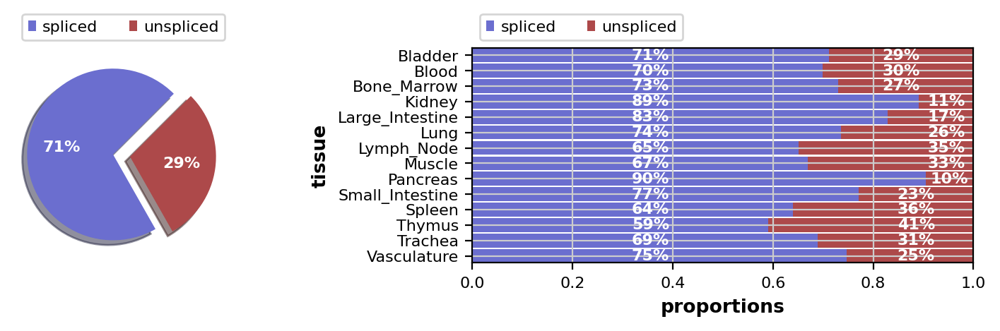

In [175]:
scv.pl.proportions(adata_velocyto,groupby='tissue')

In [176]:
scv.pp.filter_and_normalize(adata_velocyto, min_shared_counts=1)#, n_top_genes=5000)
adata_velocyto

Normalized count data: X, spliced, unspliced.


AnnData object with n_obs × n_vars = 134745 × 52549
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_metho

## Compute moments & velocity

In [177]:
scv.pp.moments(adata_velocyto, n_pcs=30, n_neighbors=15, use_rep="X_scvi_decontX")

computing neighbors
    finished (0:00:40) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:02:10) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [178]:
scv.tl.velocity(adata_velocyto,mode='stochastic')

computing velocities
    finished (1:59:37) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [179]:
scv.tl.velocity_graph(adata_velocyto)

computing velocity graph
    finished (0:30:26) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


Make sure colors are correct

In [180]:
adata_velocyto.uns['donor_colors'] = list(donors_color_dict.values())
adata_velocyto.uns['method_colors'] = list(methods_color_dict.values())
adata_velocyto.uns['compartment_pred_svm_colors'] = list(compartments_color_dict.values())
adata_velocyto.uns['tissue_colors'] = list(tissues_color_dict.values())

And plot the output

computing velocity embedding
    finished (0:00:49) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


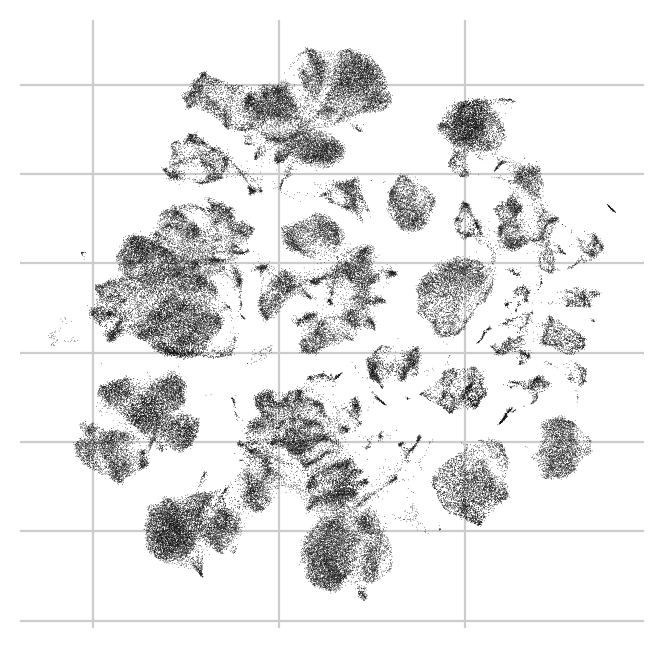

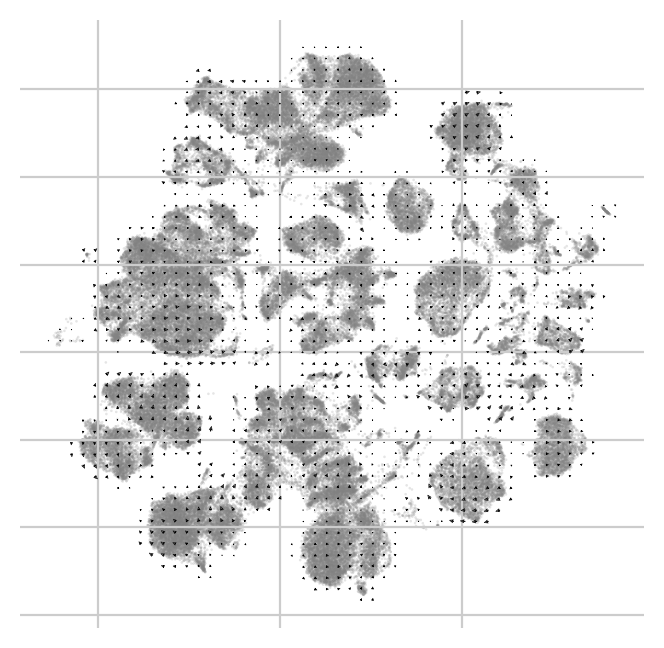

In [181]:
scv.pl.velocity_embedding(adata_velocyto, 
                          basis='umap')
scv.pl.velocity_embedding_grid(adata_velocyto, 
                               basis='umap')

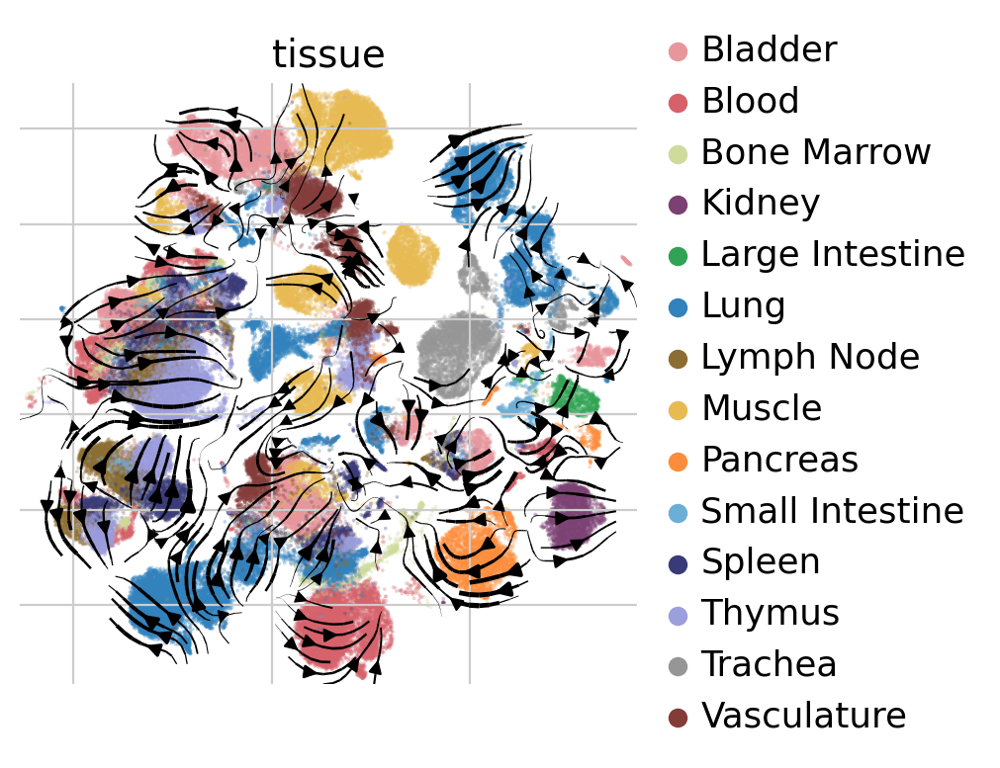

In [182]:
scv.pl.velocity_embedding_stream(adata_velocyto, legend_loc='right',
                                 basis='umap',
                                 color='tissue')

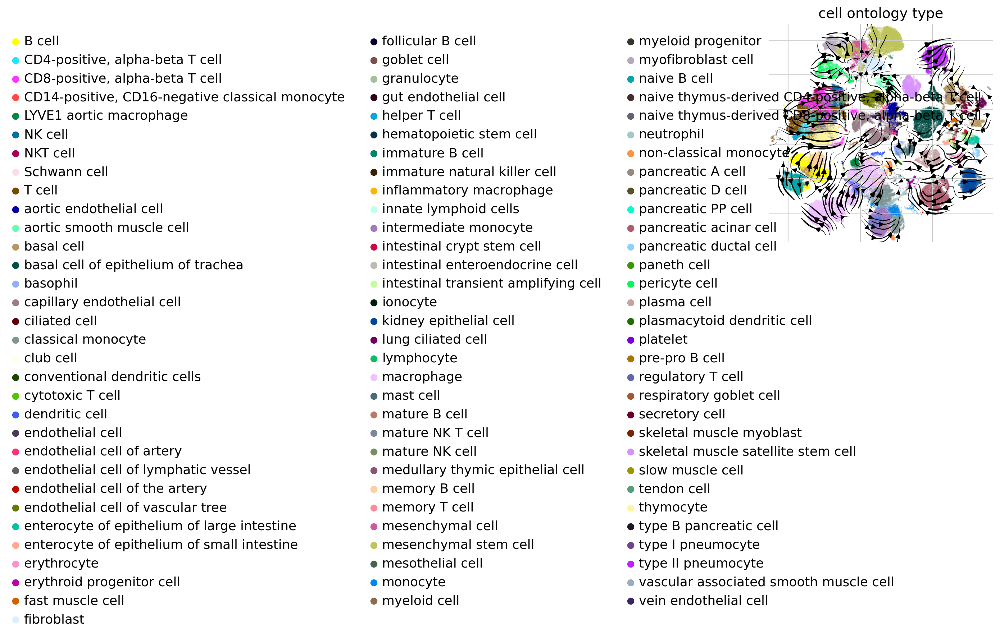

In [183]:
scv.pl.velocity_embedding_stream(adata_velocyto, legend_loc='best',
                                 basis='umap', 
                                 color="cell_ontology_type")

Write intermediary file that allows restart from here

In [184]:
adata_velocyto.write(data_path + "TSP1_TSP2_merged_counts_velocyto_with_moments-velocity_with-stress-genes.h5ad")
adata_velocyto

AnnData object with n_obs × n_vars = 134745 × 52549
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_metho

## Identify important genes

Start by looking at each tissue

In [148]:
scv.tl.rank_velocity_genes(adata_velocyto, groupby='tissue', min_corr=.3)

ranking velocity genes
    finished (0:08:57) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [149]:
df = scv.DataFrame(adata_velocyto.uns['rank_velocity_genes']['names'])
df.head()

,Bladder,Blood,Bone_Marrow,Kidney,Large_Intestine,Lung,Lymph_Node,Muscle,Pancreas,Small_Intestine,Spleen,Thymus,Trachea,Vasculature
0,SPAG9,PIK3CD,BIN2,AHCYL1,NET1,LRMDA,SMCHD1,UTP4,PDCD4,JUP,CDC42SE2,NCK2,CELSR1,RBMS3
1,NFATC1,AGTPBP1,APBB1IP,METTL9,LLGL2,SNTB1,SARAF,FBXL7,PAK3,RHPN2,PHF20,ARHGAP45,EYA4,TMOD1
2,INSIG1,ACAP2,S100PBP,LAMTOR4,RHPN2,PTPN12,SMAP2,SRGAP1,PBX1,LLGL2,BORCS5,CD96,MCC,RUNX1T1
3,JAK1,FGD3,RCSD1,MORN2,CXADR,DENND4C,ANKRD44,STK3,NFIC,FHL2,RALGAPA1,RASGRP2,NHSL1,ARGLU1
4,ELL2,DOCK8,FKBP5,MAF,KLF5,SDCCAG8,EZR,FKRP,NR5A2,SPIRE2,PPP2R5C,DEF6,DGKH,PRDM6


Interpret the velocities

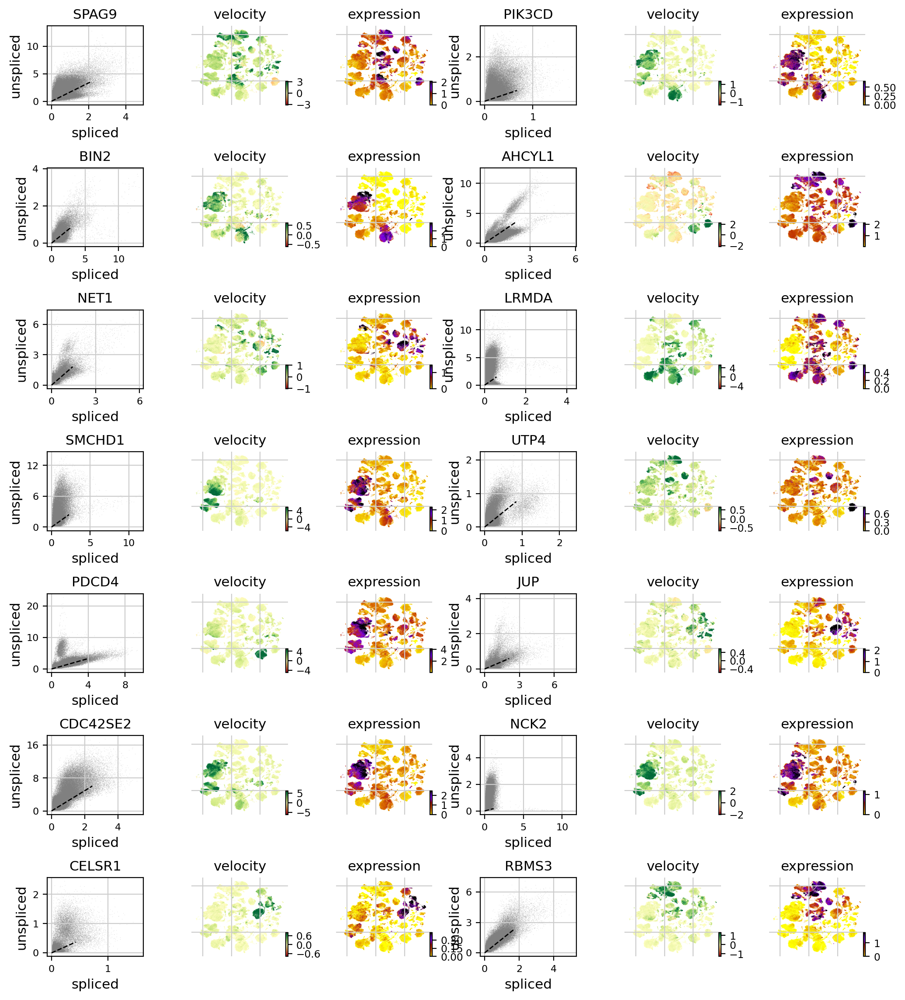

In [150]:
scv.pl.velocity(adata_velocyto, list(df.iloc[:1].values[0]), ncols=2)

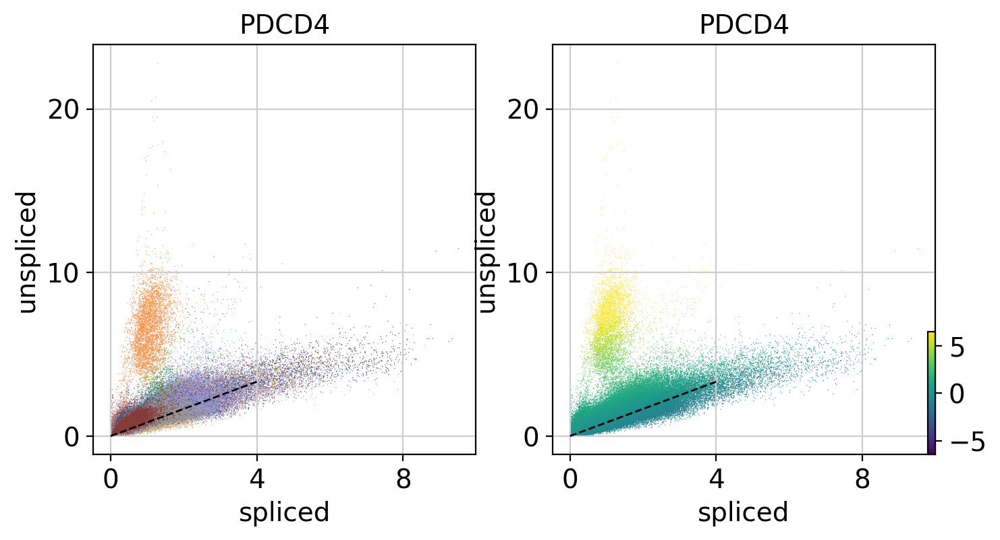

In [151]:
scv.pl.scatter(adata_velocyto, 'PDCD4', color=['tissue', 'velocity'],)
#                add_outline='Pancreas')

## Velocities in cycling progenitors

In [152]:
scv.tl.score_genes_cell_cycle(adata_velocyto)

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


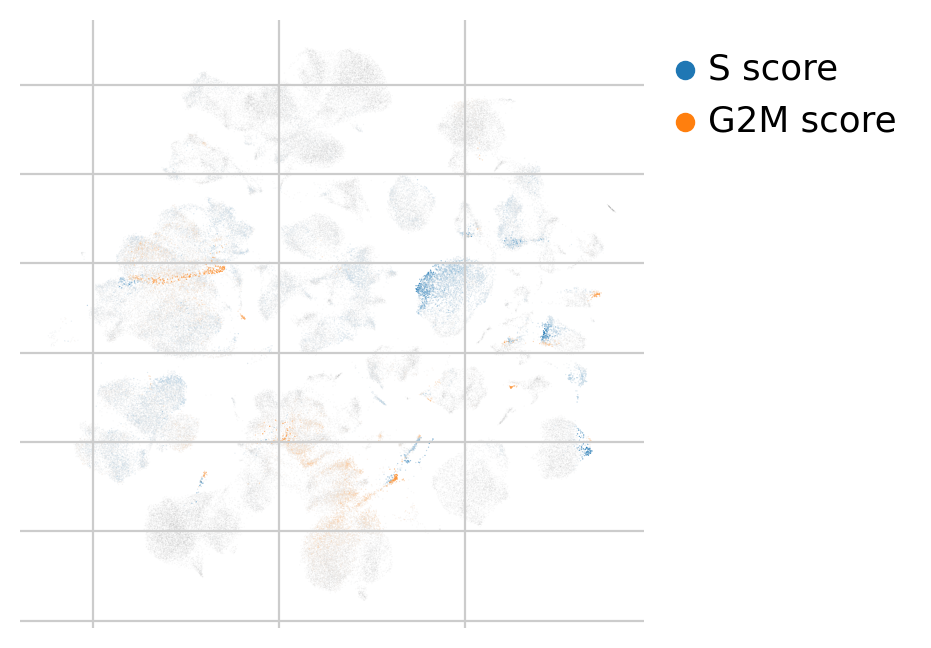

In [153]:
scv.pl.scatter(adata_velocyto, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])

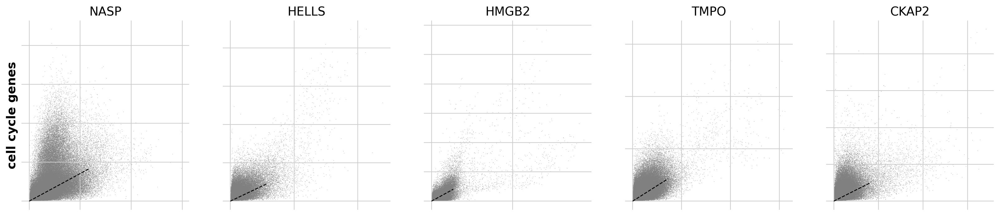

In [154]:
s_genes, g2m_genes = scv.utils.get_phase_marker_genes(adata_velocyto)
s_genes = scv.get_df(adata_velocyto[:, s_genes], 'spearmans_score', sort_values=True).index
g2m_genes = scv.get_df(adata_velocyto[:, g2m_genes], 'spearmans_score', sort_values=True).index

kwargs = dict(frameon=False, ylabel='cell cycle genes')
scv.pl.scatter(adata_velocyto, list(s_genes[:2]) + list(g2m_genes[:3]), **kwargs)


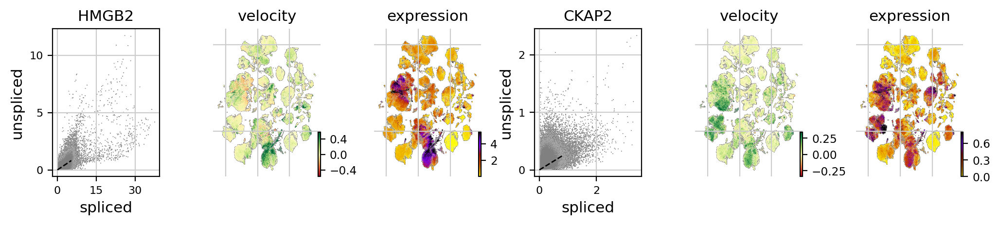

In [156]:
scv.pl.velocity(adata_velocyto, ['HMGB2', 'CKAP2'], ncols=2, add_outline=True)


--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


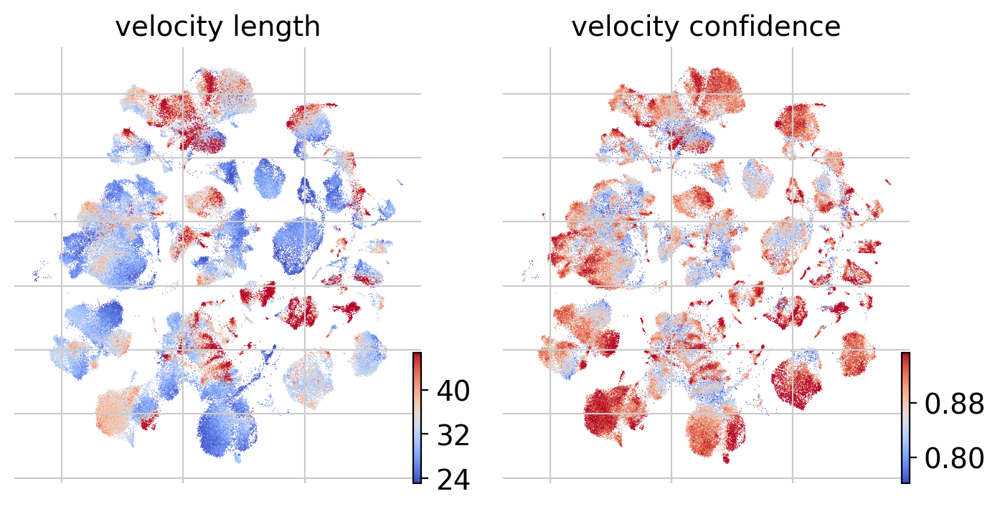

In [157]:
scv.tl.velocity_confidence(adata_velocyto)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_velocyto, c=keys, cmap='coolwarm', perc=[5, 95])

In [158]:
df = adata_velocyto.obs.groupby('tissue')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

tissue,Bladder,Blood,Bone_Marrow,Kidney,Large_Intestine,Lung,Lymph_Node,Muscle,Pancreas,Small_Intestine,Spleen,Thymus,Trachea,Vasculature
velocity_length,37.229248,30.655989,27.423483,30.603251,38.877747,33.039280,31.030964,33.380997,32.507545,35.301006,35.703785,27.957064,26.667475,31.473455
velocity_confidence,0.870037,0.893241,0.837542,0.909048,0.902101,0.879385,0.884393,0.871550,0.915187,0.859234,0.896378,0.844569,0.860309,0.834566


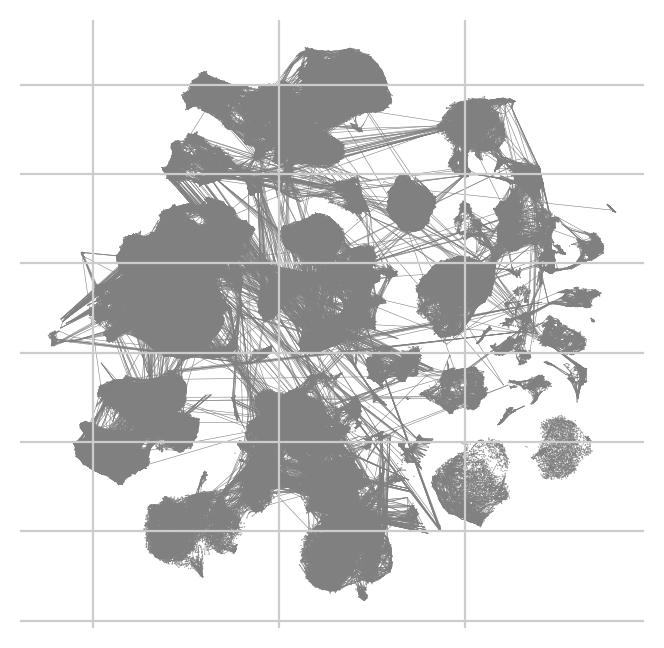

In [159]:
scv.pl.velocity_graph(adata_velocyto, threshold=.1)

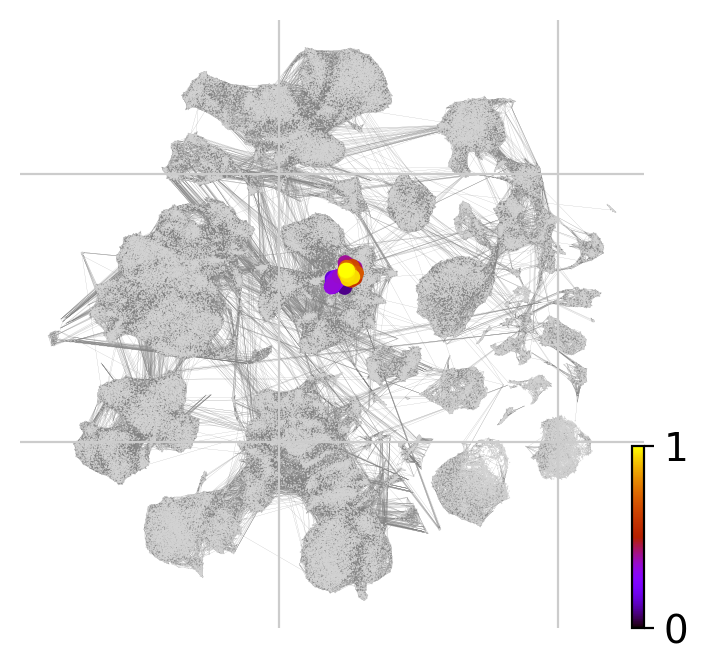

In [160]:
x, y = scv.utils.get_cell_transitions(adata_velocyto, basis='umap', starting_cell=70)
ax = scv.pl.velocity_graph(adata_velocyto, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata_velocyto, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

computing terminal states
    identified 10 regions of root cells and 10 regions of end points .
    finished (0:07:04) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


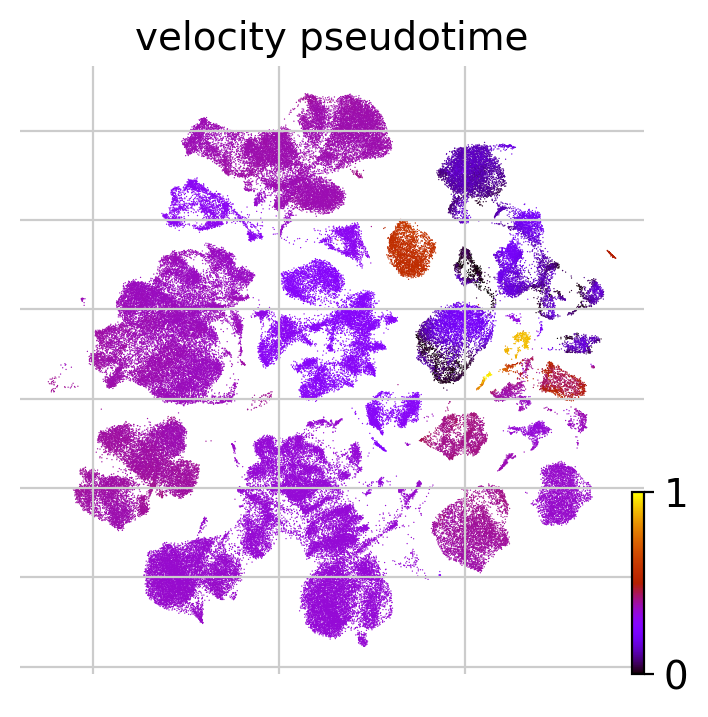

In [161]:
scv.tl.velocity_pseudotime(adata_velocyto)
scv.pl.scatter(adata_velocyto, color='velocity_pseudotime', cmap='gnuplot')

In [163]:
# this is needed due to a current bug - bugfix is coming soon.
adata_velocyto.uns['neighbors']['distances'] = adata_velocyto.obsp['distances']
adata_velocyto.uns['neighbors']['connectivities'] = adata_velocyto.obsp['connectivities']

scv.tl.paga(adata_velocyto, groups='cell_ontology_type')
df = scv.get_df(adata_velocyto, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:39) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


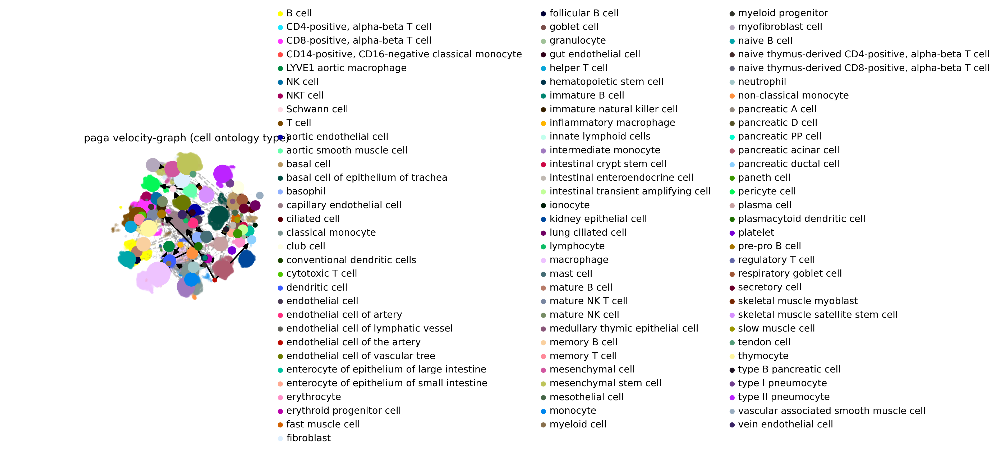

In [164]:
scv.pl.paga(adata_velocyto, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

In [165]:
scv.tl.recover_dynamics(adata_velocyto)

recovering dynamics
    finished (20:48:49) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [171]:
adata_velocyto.write(data_path + "TSP1_TSP2_merged_counts_velocyto_with_moments-velocity-cell-cycle.h5ad")
adata_velocyto

AnnData object with n_obs × n_vars = 134745 × 16116
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_metho

In [172]:
data_path

'/mnt/ibm_lg/angela/sapiens/data/sapiens_paper1/'